In [57]:
from moscot.problems.time import TemporalProblem
from cellrank.kernels import RealTimeKernel
from cellrank.kernels import PseudotimeKernel
from scipy import io
from adjustText import adjust_text


import scipy
import anndata
import os
import cellrank as cr
import scanpy as sc
import pandas as pd
import scvelo as scv
import numpy as np

import palantir
import scipy.sparse as sp

sc.settings.set_figure_params(frameon=False, dpi=100)
cr.settings.verbosity = 2

# Plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

# warnings
import warnings
from numba.core.errors import NumbaDeprecationWarning

warnings.simplefilter("ignore", category=UserWarning)
warnings.filterwarnings(action="ignore", category=NumbaDeprecationWarning)
warnings.filterwarnings(
    action="ignore", module="scanpy", message="No data for colormapping"
)

# Inline plotting
%matplotlib inline

In [2]:
import matplotlib.font_manager as fm

# First, let's add the font explicitly
font_path = '/home/uvictor/miniconda3/envs/cellrank-palantir/fonts/bahnschrift.ttf'
fm.fontManager.addfont(font_path)

# Clear the font cache and rebuild it
fm._load_fontmanager(try_read_cache=False)

# Now set the font - try the exact font name from the file
# Option 1: Use the font file name without extension

plt.rcParams['font.family'] = 'bahnschrift'
matplotlib.rcParams['axes.unicode_minus'] = False

# If that doesn't work, try Option 2: Get the exact font name
#font = fm.FontProperties(fname=font_path)
#plt.rcParams['font.family'] = font.get_name()

In [3]:
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
print(matplotlib.__version__)

colors = ["#FFFFFF", "#006199", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_wbr", colors)
plt.colormaps.register(name="custom_wbr", cmap=custom_cmap)

colors = ["#808080", "#006199", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_gbr", colors)
plt.colormaps.register(name="custom_gbr", cmap=custom_cmap)

colors = ["#0c0d0c", "#006199", "#EED365", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_bbyr", colors)
plt.colormaps.register(name="custom_bbyr", cmap=custom_cmap)

colors = ["#006199", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_br", colors)
plt.colormaps.register(name="custom_br", cmap=custom_cmap)

colors = ["#006199", "#70c269", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_btr", colors)
plt.colormaps.register(name="custom_btr", cmap=custom_cmap)

colors = ["#006199", "#70c269", "#EED365", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_btry", colors)
plt.colormaps.register(name="custom_btry", cmap=custom_cmap)

3.9.1.post1


In [4]:
path = "/mnt/f/scRNA_output/Ubels_24"
print(os.listdir(path))

output_dir = "/mnt/f/CellRank/Ubels24/Follicle_Development"

['counts.csv', 'genenames.txt', 'Lineage_Follicle.h5ad', 'metadata.csv', 'Ubels24_Follicle_scRNA.h5ad', 'umap.csv']


In [5]:
# Read the exported data

# counts = io.mmread("/mnt/c/Users/UVictor/Documents/scRNA_output/Ubels_2024/matrix.mtx").tocsr()
# metadata = pd.read_csv("/mnt/c/Users/UVictor/Documents/scRNA_output/Ubels_2024/metadata.csv", index_col=0)
# umap_coords = pd.read_csv("/mnt/c/Users/UVictor/Documents/scRNA_output/Ubels_2024/umap.csv", index_col=0)
# gene_names = pd.read_csv("/mnt/c/Users/UVictor/Documents/scRNA_output/Ubels_2024/genenames.txt", header=None)[0].tolist()

# counts_transposed = counts.T

# Create AnnData object
# adata = anndata.AnnData(X=counts_transposed, obs=metadata, var=pd.DataFrame(index=gene_names))
# adata.obsm["X_umap"] = umap_coords.values

# Read loom file
#ldata = scv.read_loom("C:/Users/UVictor/Documents/Velocyto/Ubels_loompy_combined.loom")

#scv.utils.clean_obs_names(adata)
#scv.utils.clean_obs_names(ldata)

# Merge AnnData with loom data
#adata = scv.utils.merge(adata, ldata)

adata = anndata.read_h5ad('/mnt/f/scRNA_output/Ubels_24/Lineage_Follicle.h5ad')

In [72]:
adata

AnnData object with n_obs × n_vars = 11361 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.18_1115', 'DF.classifications_0.25_0.18_1115', 'Singlet', 'estConp', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust', 'BigClust', 'pANN_0.25_0.3_254', 'DF.classifications_0.25_0.3_254', 'pANN_0.25_0.27_160', 'DF.classifications_0.25_0.27_160', 'RNA_snn_res.0.5', 'n_counts', 'dpt_pseudotime', 'palantir_pseudotime', 'palantir_entropy', 'macrostates_fwd', 'init_states_fwd', 'init_states_fwd_probs', 'term_states_fwd', 'term_states_fwd_probs'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_trends_clusters', 'mean expression'
    uns: 'DM_EigenValues', 'FineClust_colors', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'neighbors', 'palantir_waypoints', 'pca', 'umap', 'T_fwd_params', '

<Figure size 600x600 with 0 Axes>

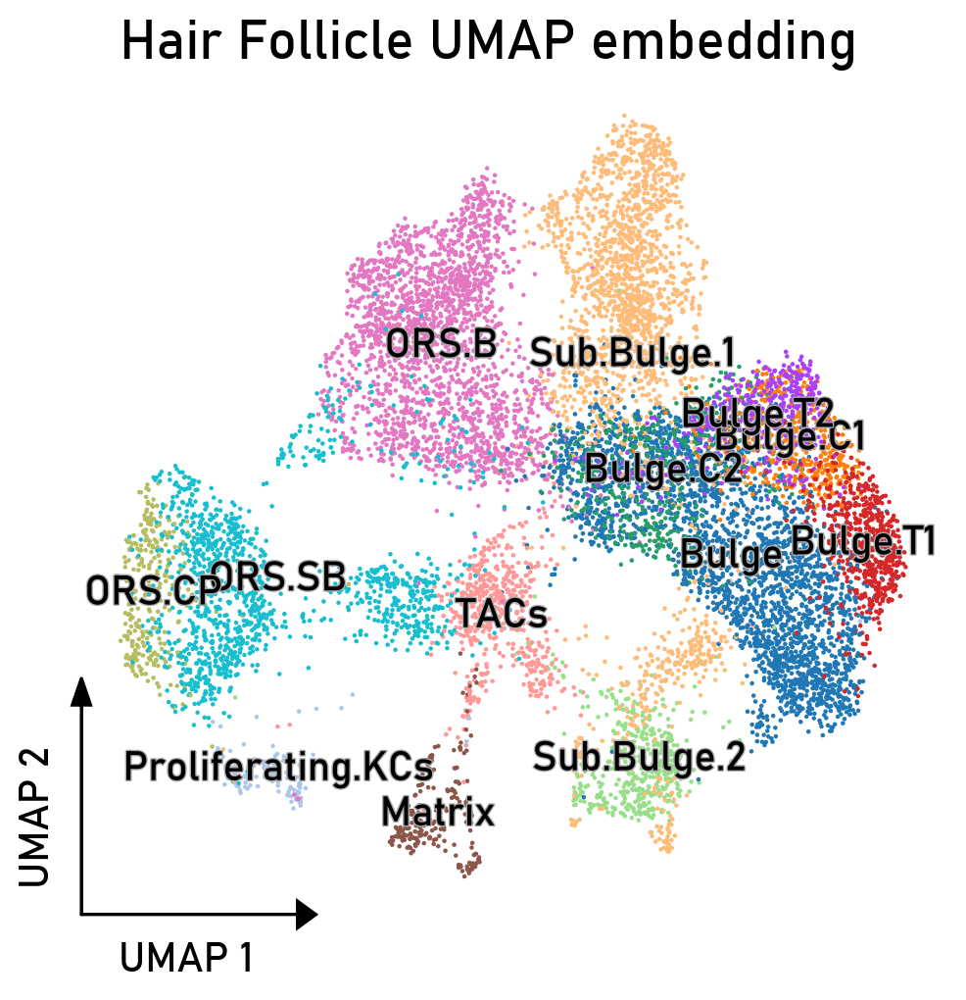

In [84]:
plt.figure(figsize=(6, 6))  

def plot_embedding_umap_cat(adata, plot_title, color_var, legend_fontsize, figsize=(6, 6)):
    """
    Create a UMAP for embedding key
    """
    # Call plot_random_walks
    with plt.rc_context({'figure.figsize': figsize}):
        sc.pl.embedding(
        adata = adata,
        basis="umap",
        frameon = True,
        title = plot_title,
        show = False,
        color = color_var
    )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.get_legend().remove()
    ax.set_title(plot_title, fontsize=20)
    ax.set_xlabel('UMAP 1', fontsize=15)
    ax.set_ylabel('UMAP 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=.5, head_length=.5, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
    
    texts = []
    
    for group in adata.obs[color_var].unique():
        mask = adata.obs[color_var] == group
        x = adata.obsm['X_umap'][mask, 0].mean()
        y = adata.obsm['X_umap'][mask, 1].mean()
        text = ax.text(x, y, str(group),
                         fontsize=legend_fontsize,
                         path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                         ha='center',
                         va='center')
        texts.append(text)
            
    return ax

ax = plot_embedding_umap_cat(adata = adata, color_var = "FineClust", plot_title = "Hair Follicle UMAP embedding", legend_fontsize = 15)
plt.savefig(os.path.join(output_dir, 'HairFollicleUMAP.png'), bbox_inches='tight')

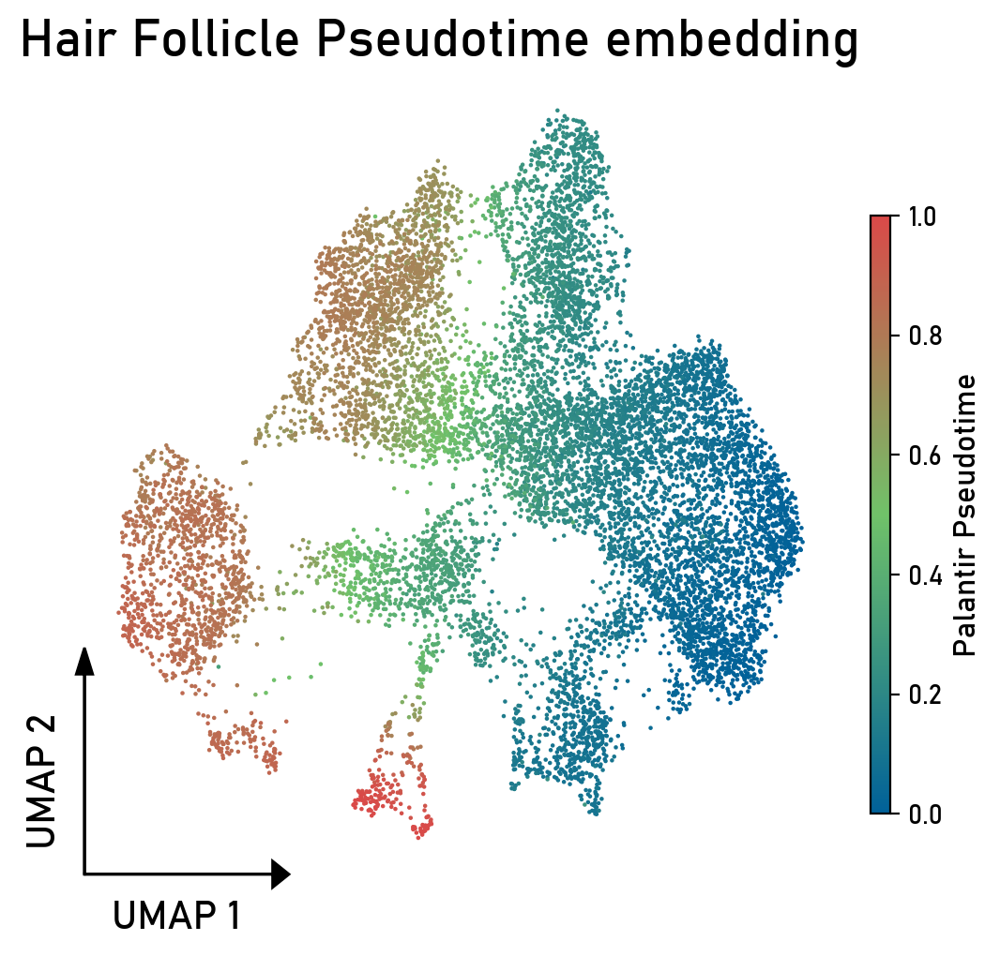

In [87]:
def plot_embedding_umap_time(adata, plot_title, color_var, legend_fontsize, figsize=(6, 6), continuous_cmap='custom_btr', colorbar_label="Pseudotime"):
    """
    Create a UMAP for embedding key, handling both categorical and continuous variables
    
    Parameters:
    -----------
    adata : AnnData
        Annotated data matrix
    plot_title : str
        Title for the plot
    color_var : str
        Variable to color by (can be categorical or continuous)
    legend_fontsize : int
        Font size for legend
    figsize : tuple
        Figure size
    continuous_cmap : str
        Colormap to use for continuous variables
    colorbar_label : str
        Label for the colorbar (default: "Pseudotime")
    """
    # Determine if variable is continuous or categorical
    is_continuous = (
        np.issubdtype(adata.obs[color_var].dtype, np.number) and 
        not pd.api.types.is_categorical_dtype(adata.obs[color_var])
    )
    
    # Call plot 
    with plt.rc_context({'figure.figsize': figsize}):
        if is_continuous:
            # For continuous variables
            sc.pl.embedding(
                adata=adata,
                basis="umap",
                frameon=True,
                title=plot_title,
                show=False,
                color=color_var,
                cmap=continuous_cmap
            )
            
            # Modify colorbar
            fig = plt.gcf()
            cbar_ax = fig.get_axes()[-1]  # Get the colorbar axis
            
            # Adjust colorbar size and position
            pos = cbar_ax.get_position()
            cbar_ax.set_position([pos.x0 + 0.02, pos.y0 + 0.1, pos.width * 0.7, pos.height * 0.7])
            
            # Set colorbar label
            cbar_ax.set_ylabel(colorbar_label, fontsize=12)
            
            # Adjust colorbar tick label size
            cbar_ax.tick_params(labelsize=10)
            
        else:
            # For categorical variables
            sc.pl.embedding(
                adata=adata,
                basis="umap",
                frameon=True,
                title=plot_title,
                show=False,
                color=color_var,
                legend_loc='on data',
                legend_fontsize=legend_fontsize
            )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=20)
    ax.set_xlabel('UMAP 1', fontsize=15)
    ax.set_ylabel('UMAP 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=.5, head_length=.5, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
    
    # Only add text labels for categorical variables
    if not is_continuous:
        texts = []
        for group in adata.obs[color_var].unique():
            mask = adata.obs[color_var] == group
            x = adata.obsm['X_umap'][mask, 0].mean()
            y = adata.obsm['X_umap'][mask, 1].mean()
            text = ax.text(x, y, str(group),
                         fontsize=legend_fontsize,
                         path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                         ha='center',
                         va='center')
            texts.append(text)
    
    return ax

ax = plot_embedding_umap_time(adata = adata,
                              color_var = "palantir_pseudotime",
                              plot_title = "Hair Follicle Pseudotime embedding",
                              colorbar_label = "Palantir Pseudotime",
                              legend_fontsize = 15)

plt.savefig(os.path.join(output_dir, 'HairFolliclePseudotimeUMAP.png'), bbox_inches='tight')

In [8]:
pk = PseudotimeKernel(adata, time_key="palantir_pseudotime")
pk.compute_transition_matrix()

Computing transition matrix based on pseudotime


  0%|          | 0/11361 [00:00<?, ?cell/s]

    Finish (0:00:07)


PseudotimeKernel[n=11361, dnorm=False, scheme='hard', frac_to_keep=0.3]

Simulating `200` random walks of maximum length `2841`


  0%|          | 0/200 [00:00<?, ?sim/s]

    Finish (0:02:37)
Plotting random walks


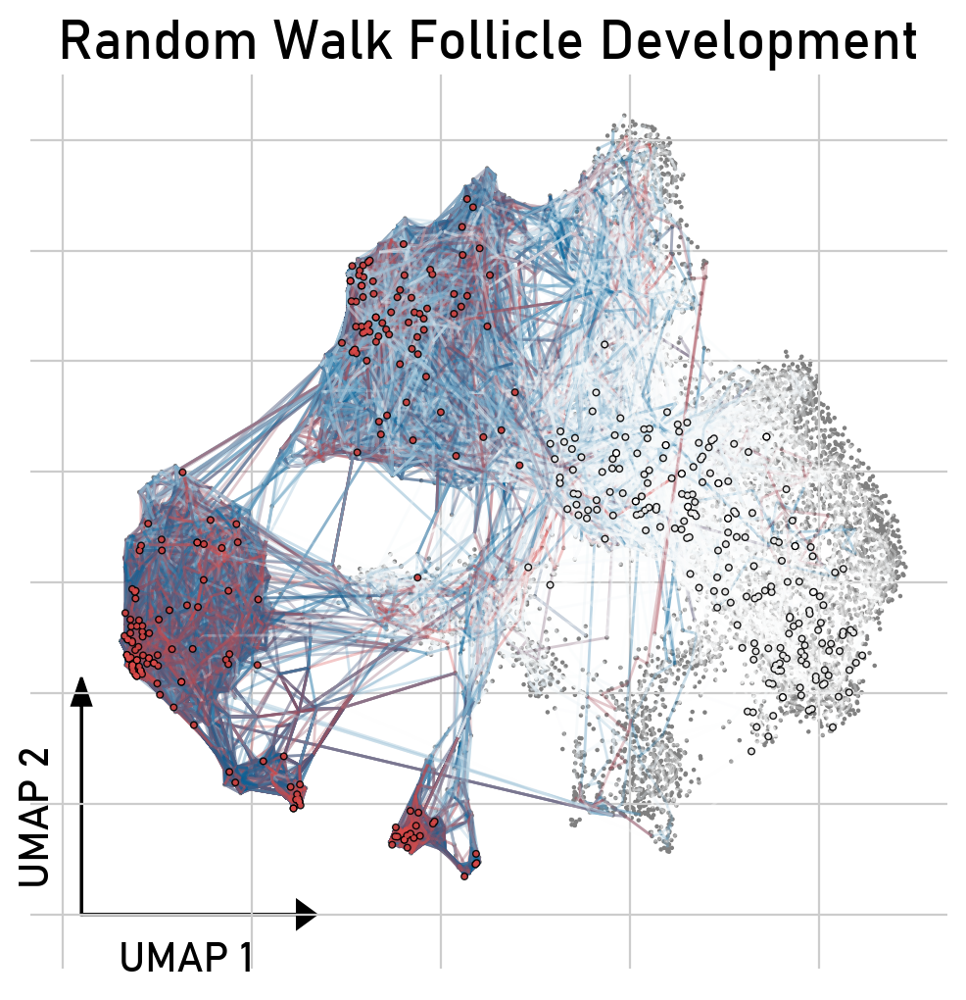

In [11]:
def plot_randomwalk_umap(adata, plot_title, figsize=(6, 6)):
    """
    Create a umap for Random Walk simulation
    """
    # Call plot_random_walks
    with plt.rc_context({'figure.figsize': figsize}):
        pk.plot_random_walks(
        seed=0,
        n_sims=200,
        start_ixs={"FineClust": "Bulge"},
        basis="umap",
        cmap = "custom_wbr",
        title = "Random Walk Follicle Development",
        fontsize = 15
    )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=20)
    ax.set_xlabel('UMAP 1', fontsize=15)
    ax.set_ylabel('UMAP 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=.5, head_length=.5, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
            
    return ax

# Create the plot
ax = plot_randomwalk_umap(adata, 
                          plot_title="Random Walk Follicle Development")

plt.savefig(os.path.join(output_dir, 'RandomWalkFollicleDevelopment.png'), bbox_inches='tight')

Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:04)


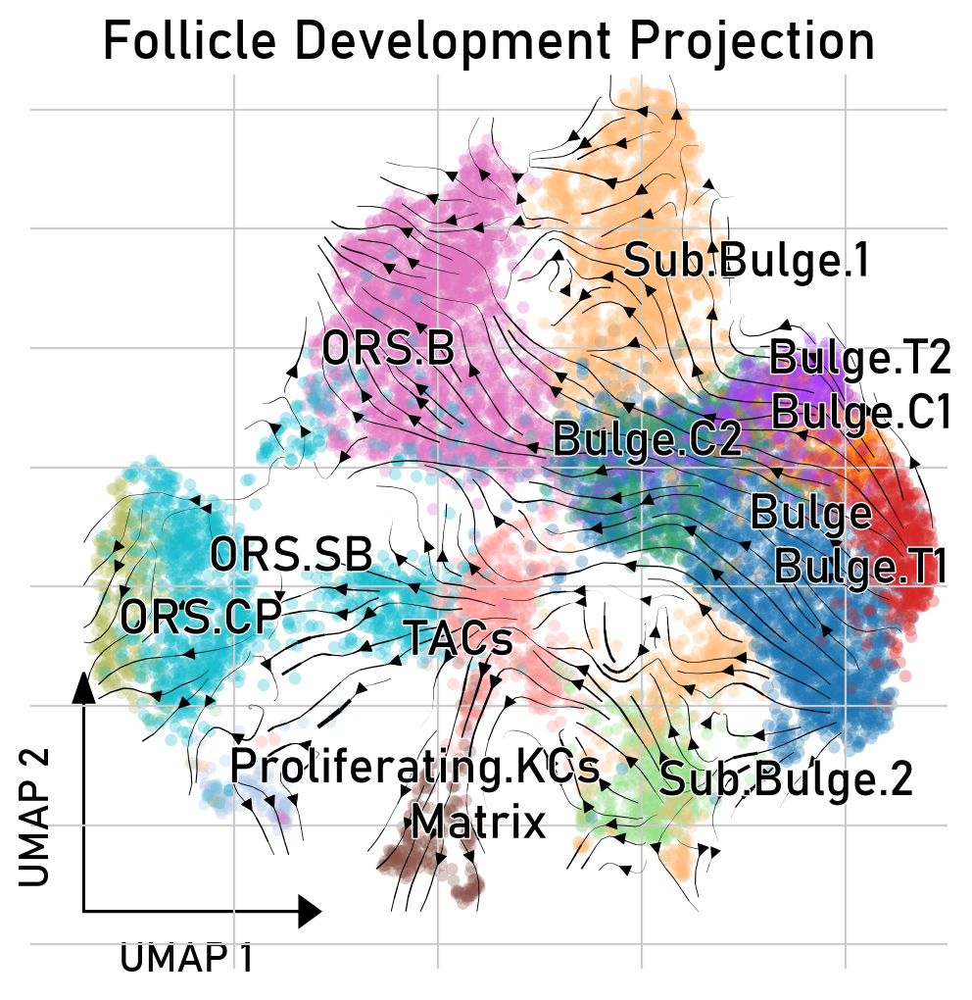

In [12]:
def plot_projection_umap(adata, plot_title, figsize=(6, 6)):
    """
    Create a umap for projection of trajectories
    """
    # Call plot_random_walks
    with plt.rc_context({'figure.figsize': figsize}):
        pk.plot_projection(basis="umap",
                  recompute=True,
                  color="FineClust",
                  legend_fontsize = 18,
                  frameon=True,
                  legend_loc='on data',
                  legend_align_text='xy',
                  show = False
                  )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=20)
    ax.set_xlabel('UMAP 1', fontsize=15)
    ax.set_ylabel('UMAP 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=.5, head_length=.5, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
            
    return ax

# Create the plot
ax = plot_projection_umap(adata, 
                          plot_title="Follicle Development Projection")

plt.savefig(os.path.join(output_dir, 'FollicleDevelopmentProjection.png'), bbox_inches='tight')

In [13]:
pk

PseudotimeKernel[n=11361, dnorm=False, scheme='hard', frac_to_keep=0.3]

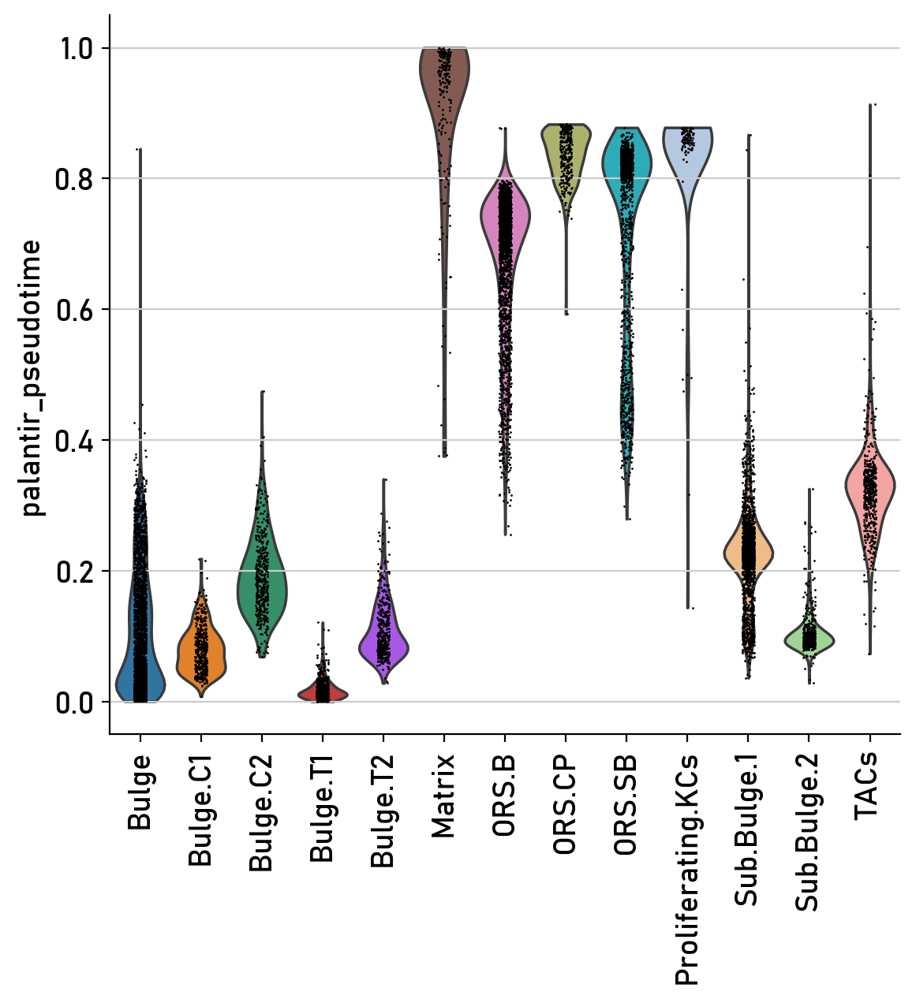

In [14]:
plt.rcParams['figure.figsize'] = [6, 6]

file_path = os.path.join(output_dir, "Follicle_Anagen_PseudoTimeBatch.png")

sc.pl.violin(adata, keys=["palantir_pseudotime"], groupby="FineClust", rotation=90)

plt.savefig(file_path)
plt.close()

In [15]:
g = cr.estimators.GPCCA(pk)
g.fit(cluster_key="FineClust", n_states=21)

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[16, 18, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)
Computing `21` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:02:52)


GPCCA[kernel=PseudotimeKernel[n=11361], initial_states=None, terminal_states=None]

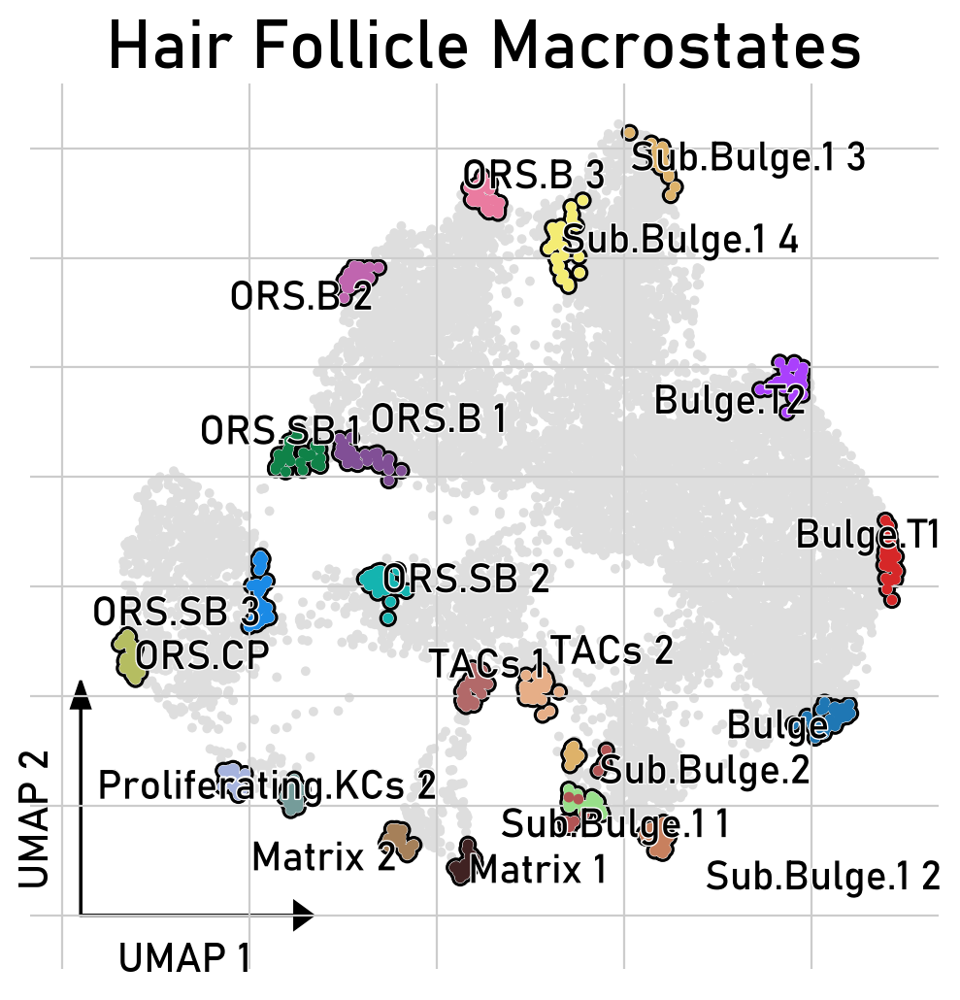

In [16]:
def plot_macrostates_umap(adata, plot_title, figsize=(6, 6)):
    """
    Create a UMAP plot for Macrostates
    """
    # Call plot_random_walks
    with plt.rc_context({'figure.figsize': figsize}):
        g.plot_macrostates(which="all",
                           discrete=True,
                           s=50,
                           basis='umap',
                           show = False,
                           legend_loc='on data',
                           legend_align_text='xy',
                           frameon = True,
                           legend_fontsize = 15,
                          )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=25)
    ax.set_xlabel('UMAP 1', fontsize=15)
    ax.set_ylabel('UMAP 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=.5, head_length=.5, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
            
    return ax

# Create the plot
ax = plot_macrostates_umap(adata, 
                          plot_title="Hair Follicle Macrostates")

plt.savefig(os.path.join(output_dir, 'FollicleDevelopmentMacrostates.png'), bbox_inches='tight')

In [17]:
g.set_initial_states(states=["Bulge"])
g.set_terminal_states(states=["Proliferating.KCs_1", "ORS.CP", "Matrix_1", "Matrix_2", "ORS.SB_1", "ORS.SB_3", "ORS.B_2" , "ORS.B_3", "Bulge.T1"])

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


GPCCA[kernel=PseudotimeKernel[n=11361], initial_states=['Bulge'], terminal_states=['Bulge.T1', 'Matrix_1', 'Matrix_2', 'ORS.B_2', 'ORS.B_3', 'ORS.CP', 'ORS.SB_1', 'ORS.SB_3', 'Proliferating.KCs_1']]

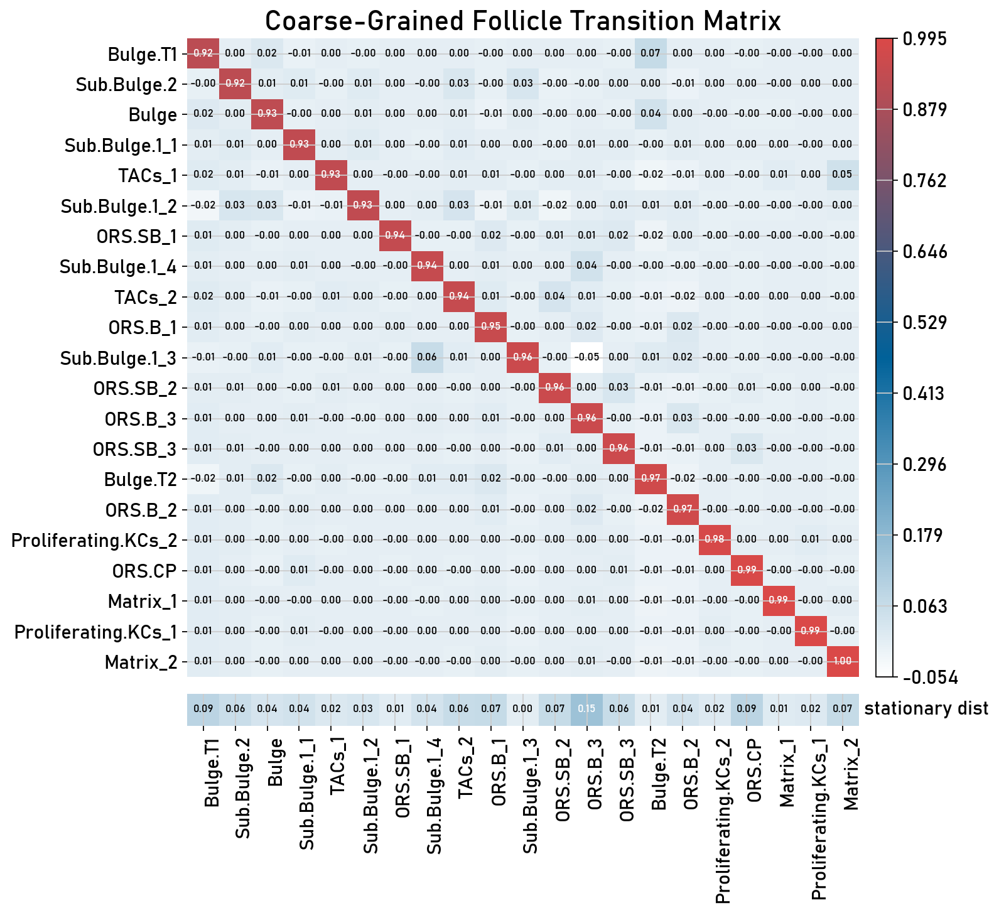

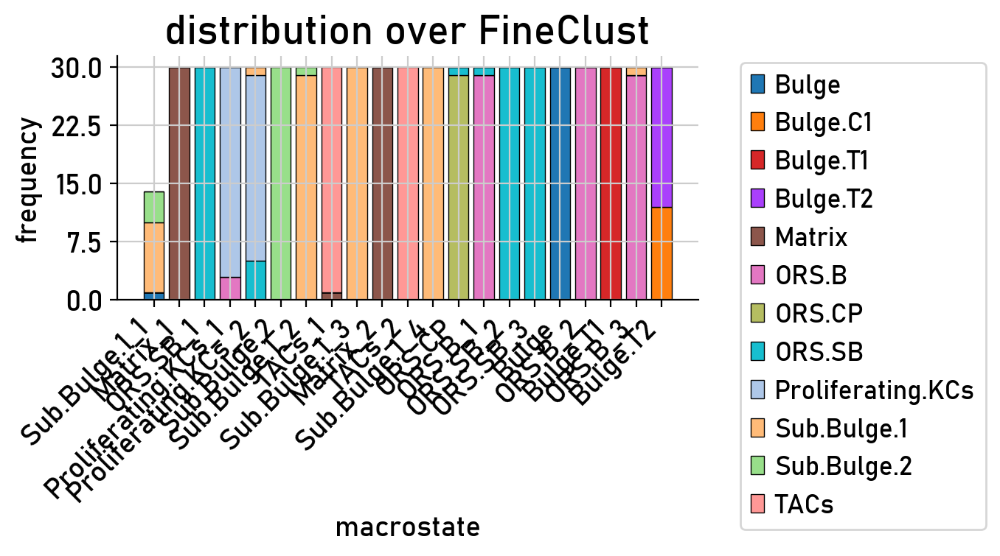

In [18]:
plt.rcParams.update({
    'axes.titlesize': 20
})


g.plot_coarse_T(title="Coarse-Grained Follicle Transition Matrix",
                figsize=(9,9),
                xtick_rotation = 90,
                cmap = "custom_wbr",
                text_kwargs={'fontsize': 8},
                save = os.path.join(output_dir, "FollicleDevelopment_CoarseTMatrix.png")
)

g.plot_macrostate_composition(key="FineClust", figsize=(7, 4))

Computing fate probabilities


  0%|          | 0/9 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)
saving figure to file /mnt/f/CellRank/Ubels24/Follicle_Development/Follicle_Anagen_FateProbabilities.png


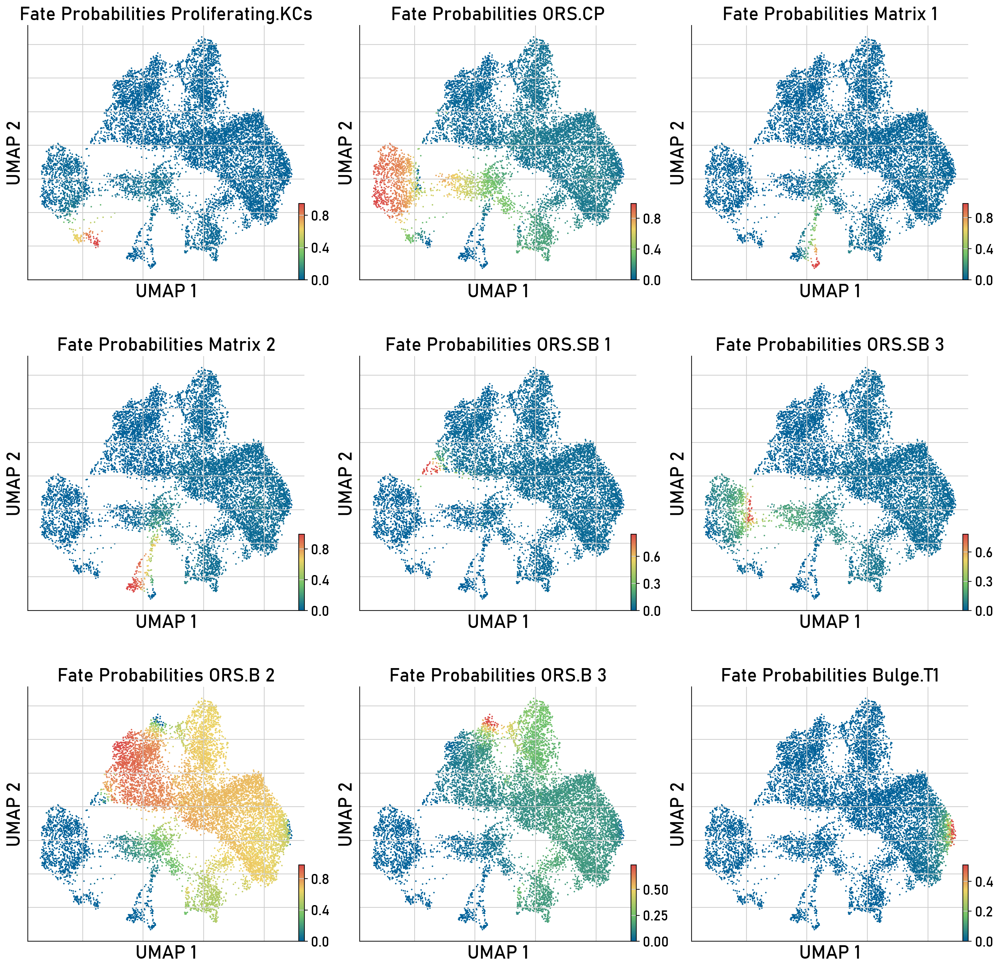

In [19]:
g.compute_fate_probabilities()

titles = ["Fate Probabilities Proliferating.KCs", "Fate Probabilities ORS.CP", "Fate Probabilities Matrix_1",
          "Fate Probabilities Matrix_2", "Fate Probabilities ORS.SB_1", "Fate Probabilities ORS.SB_3",
          "Fate Probabilities ORS.B_2", "Fate Probabilities ORS.B_3", "Fate Probabilities Bulge.T1"]

g.plot_fate_probabilities(same_plot=False,
                          cmap = "custom_btry",
                          title=titles,
                          frameon = True,
                          fontsize = 20,
                          xlabel="UMAP 1",
                          ylabel="UMAP 2",
                          nrows = 3,
                          figsize = (6,6),
                          save = os.path.join(output_dir, "Follicle_Anagen_FateProbabilities.png"))

Solving TSP for `9` states


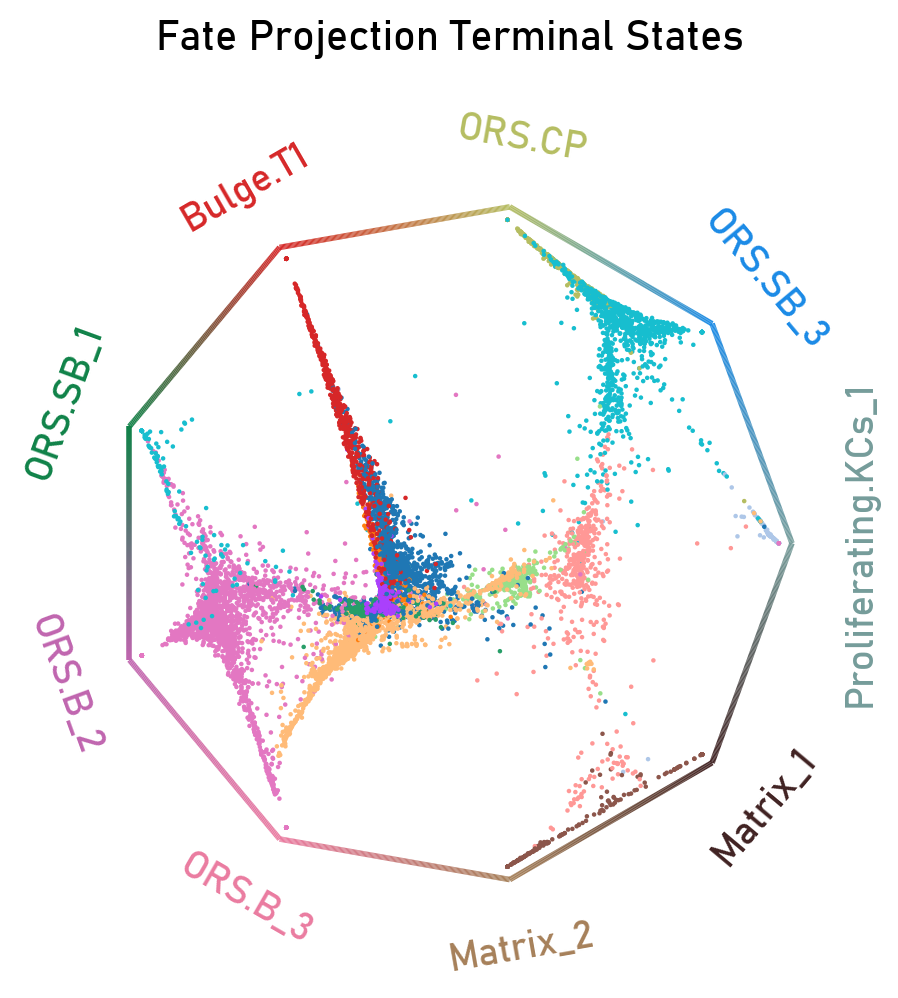

In [20]:
cr.pl.circular_projection(adata,
                          keys=["FineClust"],
                          figsize = (25,25),
                          title = "Fate Projection Terminal States",
                          legend_loc=False)

plt.title("Fate Projection Terminal States", fontsize = 15, pad=30)
plt.savefig(os.path.join(output_dir,'FateProjectionTerminalStates.png'), dpi=300, bbox_inches='tight')

In [21]:
driver_df = g.compute_lineage_drivers()

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:01)


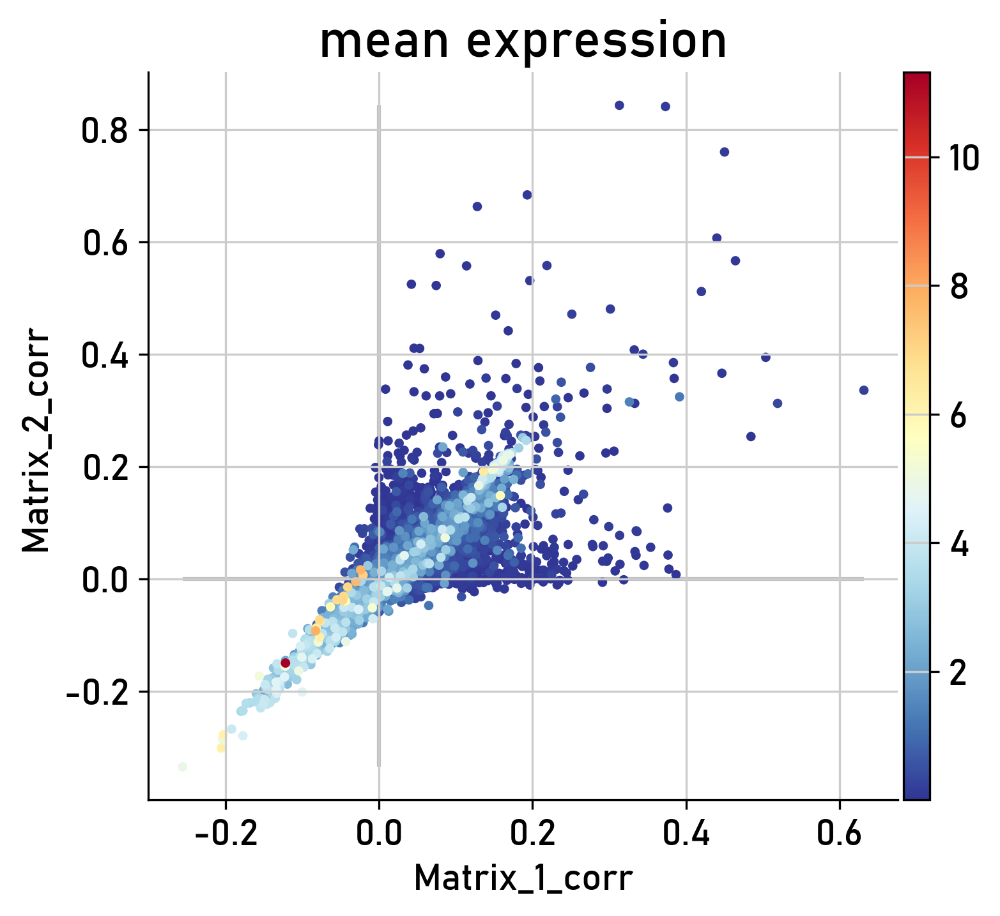

In [22]:
adata.var["mean expression"] = adata.X.A.mean(axis=0)

# visualize in a scatter plot
g.plot_lineage_drivers_correlation(
    
    lineage_x="Matrix_1",
    lineage_y="Matrix_2",
    adjust_text=True,
    color="mean expression",
    legend_loc="none",
    figsize=(5, 5),
    dpi=150,
    fontsize=9,
    size=50
)

In [23]:
def extract_genes_by_correlation(
    gpcca_obj,
    lineage_x,
    lineage_y,
    x_threshold,
    y_threshold,
    x_direction="less",
    y_direction="greater"
):
    """
    Extract genes based on correlation thresholds for two lineages.
    """
    # Try to get correlations directly from varm
    try:
        lineage_corr = gpcca_obj.adata.varm['terminal_lineage_drivers']
        if isinstance(lineage_corr, pd.DataFrame):
            corr_df = lineage_corr
        else:
            corr_df = pd.DataFrame(lineage_corr, index=gpcca_obj.adata.var_names)
    except:
        # If that fails, try getting correlations through lineage_drivers property
        lineage_corr = gpcca_obj.lineage_drivers
        corr_df = pd.DataFrame(lineage_corr, index=gpcca_obj.adata.var_names)
    
    print("Available lineages:", corr_df.columns.tolist())
    
    # Create masks based on thresholds and directions
    if x_direction == "less":
        x_mask = corr_df[lineage_x] < x_threshold
    else:
        x_mask = corr_df[lineage_x] > x_threshold
        
    if y_direction == "less":
        y_mask = corr_df[lineage_y] < y_threshold
    else:
        y_mask = corr_df[lineage_y] > y_threshold
    
    # Combine masks to get genes meeting both criteria
    filtered_df = corr_df[[lineage_x, lineage_y]][x_mask & y_mask]
    
    # Sort by y correlation (can change this if needed)
    filtered_df = filtered_df.sort_values(by=lineage_y, ascending=(y_direction=="less"))
    
    return filtered_df

In [24]:
filtered_genes_matrix_1 = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="Matrix_1_corr",
    lineage_y="Matrix_2_corr",
    x_threshold=0.4,
    y_threshold=0.4,
    x_direction="less",
    y_direction="Greater"
)

# Display the results
print(f"\nFound {len(filtered_genes_matrix_1)} genes matching criteria")
display(filtered_genes_matrix_1)

# Get just the gene names if needed
gene_list_matrix_1 = filtered_genes_matrix_1.index.tolist()
print(gene_list_matrix_1)

filtered_genes_matrix_2 = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="Matrix_1_corr",
    lineage_y="Matrix_2_corr",
    x_threshold=0.3,
    y_threshold=0.1,
    x_direction="greater",
    y_direction="less"
)

# Display the results
print(f"\nFound {len(filtered_genes_matrix_2)} genes matching criteria")
display(filtered_genes_matrix_2)

# Get just the gene names if needed
gene_list_matrix_2 = filtered_genes_matrix_2.index.tolist()
print(gene_list_matrix_2)

Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr', 'ORS.B_2_pval', 'ORS.B_2_qval', 'ORS.B_2_ci_low', 'ORS.B_2_ci_high', 'ORS.B_3_corr', 'ORS.B_3_pval', 'ORS.B_3_qval', 'ORS.B_3_ci_low', 'ORS.B_3_ci_high', 'Bulge.T1_corr', 'Bulge.T1_pval', 'Bulge.T1_qval', 'Bulge.T1_ci_low', 'Bulge.T1_ci_high']

Found 17 genes matching criteria


,Matrix_1_corr,Matrix_2_corr
KRT35,0.313177,0.842816
KRT85,0.373203,0.840705
CPA6,0.193120,0.683361
LY6G6D,0.128007,0.662649
PRR9,0.079567,0.578723
SELENBP1,0.218727,0.557603
DSG4,0.114002,0.557064
KIF5C,0.196427,0.530758
HEPHL1,0.042123,0.524345
TESC,0.074466,0.522090


['KRT35', 'KRT85', 'CPA6', 'LY6G6D', 'PRR9', 'SELENBP1', 'DSG4', 'KIF5C', 'HEPHL1', 'TESC', 'DLX3', 'ASS1', 'PCDH19', 'PSORS1C2', 'KRT31', 'KRTAP11-1', 'PAG1']
Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr', 'ORS.B_2_pval', 'ORS.B_2_qval', 'ORS.B_2_ci_low', 'ORS.B_2_ci_high', 'ORS.B_3_corr', 'ORS.B_3_pval', 'ORS.B_3_qval', 'ORS.B_3_ci_low', 'ORS.B_3_ci_high', 'Bulge.T1_corr', 'Bulge.T1_pval', 'Bulge.T1_qval', 'Bulge.T1_ci_

,Matrix_1_corr,Matrix_2_corr
H3C2,0.318843,-0.001665
H2AC13,0.386942,0.007551
TMSB15A,0.307622,0.014060
H2AC14,0.377718,0.017299
BIRC5,0.345250,0.023834
DLGAP5,0.313941,0.025942
PIMREG,0.334828,0.041923
UBE2C,0.376537,0.042328
MKI67,0.333465,0.048521
MAD2L1,0.353861,0.056130


['H3C2', 'H2AC13', 'TMSB15A', 'H2AC14', 'BIRC5', 'DLGAP5', 'PIMREG', 'UBE2C', 'MKI67', 'MAD2L1', 'PCLAF', 'MT1M', 'CENPF']


In [25]:
genes_oi_matrix = {"Matrix_1": gene_list_matrix_1, "Matrix_2": gene_list_matrix_2,} 

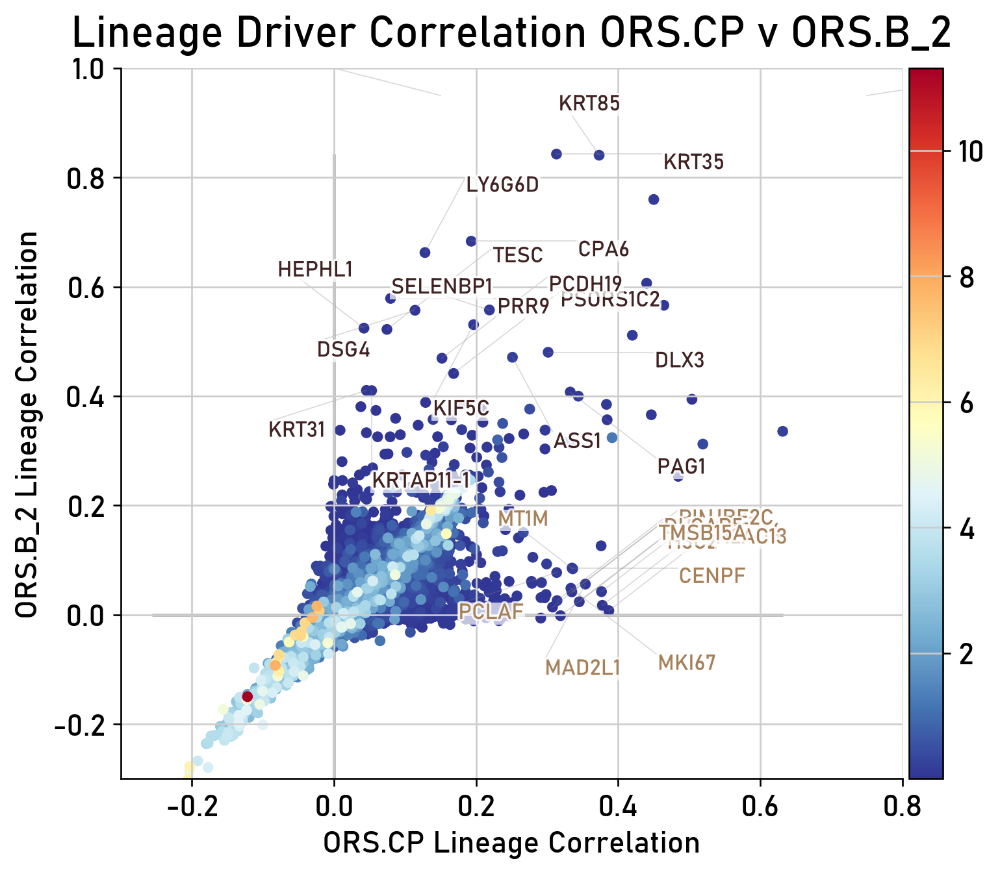

In [26]:
# Your initial plot code remains the same
ax = g.plot_lineage_drivers_correlation(
    lineage_x="Matrix_1",
    lineage_y="Matrix_2",
    gene_sets=genes_oi_matrix,
    color="mean expression",
    legend_loc="none",
    figsize=(6, 6),
    size=100,
    dpi=120,
    show=False
)

texts = [child for child in ax.get_children() 
         if isinstance(child, plt.Text) and 
         child not in [ax.xaxis.label, ax.yaxis.label, ax.title]]

def improved_spread_labels(ax, texts, min_distance=0.15, min_dist_between_labels=0.15):
    """
    Improved label spreading with boundary constraints
    """
    texts = sorted(texts, key=lambda t: t.get_position()[1], reverse=True)
    used_positions = []
    
    # Get axis limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # Add some padding to avoid touching the edges
    padding = 0.05
    x_min, x_max = xlim[0] + padding, xlim[1] - padding
    y_min, y_max = ylim[0] + padding, ylim[1] - padding
    
    def check_position_available(new_pos):
        # Check if position is within bounds
        if not (x_min <= new_pos[0] <= x_max and y_min <= new_pos[1] <= y_max):
            return False
            
        # Check distance from other labels
        for used_pos in used_positions:
            dx = new_pos[0] - used_pos[0]
            dy = new_pos[1] - used_pos[1]
            if np.sqrt(dx*dx + dy*dy) < min_dist_between_labels:
                return False
        return True
    
    angles = np.linspace(0, 2*np.pi, 16, endpoint=False)
    
    for text in texts:
        x, y = text.get_position()
        best_pos = None
        
        # Try different distances
        for distance in [min_distance, min_distance*1.15, min_distance*1.3]:
            if best_pos is not None:
                break
                
            for angle in angles:
                new_x = x + distance * np.cos(angle)
                new_y = y + distance * np.sin(angle)
                
                # Clamp positions to plot boundaries
                new_x = np.clip(new_x, x_min, x_max)
                new_y = np.clip(new_y, y_min, y_max)
                
                if check_position_available((new_x, new_y)):
                    best_pos = (new_x, new_y)
                    used_positions.append(best_pos)
                    break
        
        if best_pos is None:
            # If no good position found, use clamped original position
            best_pos = (np.clip(x + min_distance, x_min, x_max),
                       np.clip(y + min_distance, y_min, y_max))
            used_positions.append(best_pos)
        
        # Update text position
        text.set_position(best_pos)
        
        # Add connecting line
        ax.plot([x, best_pos[0]], [y, best_pos[1]], 
                color='gray', linewidth=0.5, alpha=0.3,
                zorder=1)
        
        text.set_fontsize(10)
        text.set_bbox(dict(facecolor='white', 
                          edgecolor='none',
                          alpha=0.7,
                          pad=0.5))

# Set axis limits before applying label spreading
ax.set_xlim(-0.3, 0.8)
ax.set_ylim(-0.3, 1)

# Apply the label spreading
improved_spread_labels(ax, texts)

# Set labels and title
ax.set_xlabel('ORS.CP Lineage Correlation')
ax.set_ylabel('ORS.B_2 Lineage Correlation')
ax.set_title('Lineage Driver Correlation ORS.CP v ORS.B_2', size=20, pad=10)

plt.draw()
plt.savefig(os.path.join(output_dir,'LineageDriverCorrelationM1_M2.png'))
plt.show()

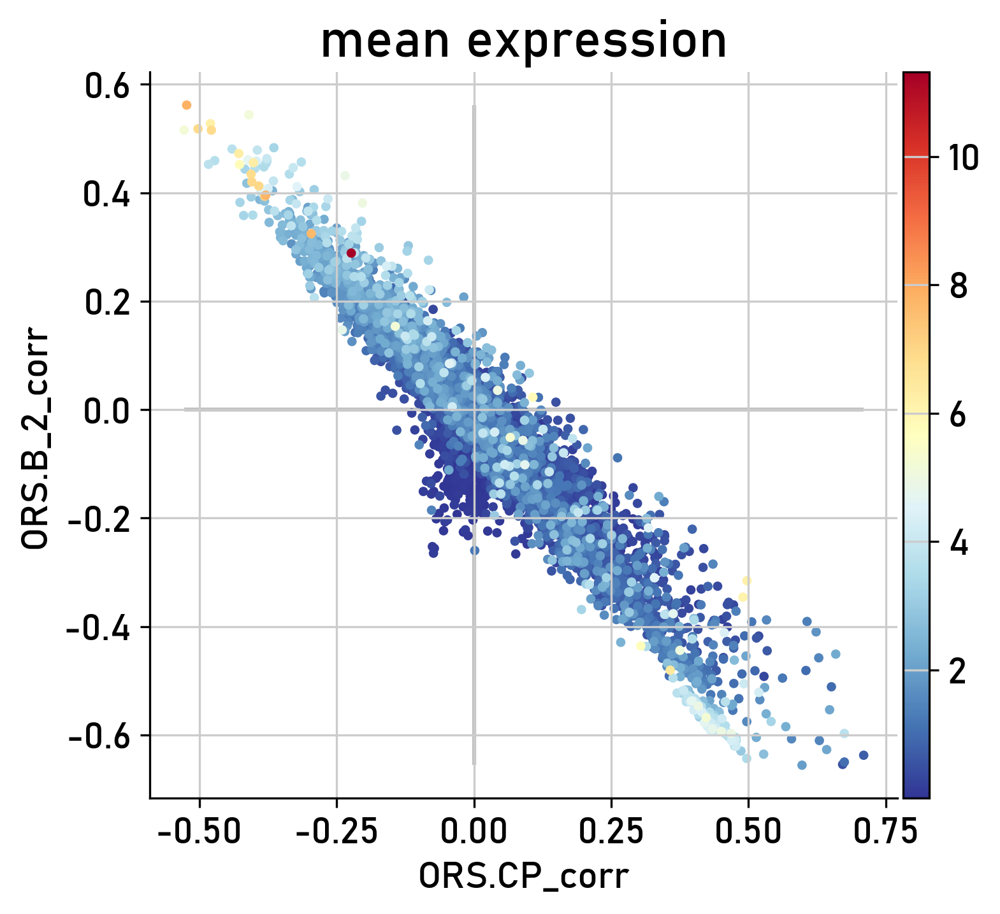

In [27]:
g.plot_lineage_drivers_correlation(
    lineage_x="ORS.CP",
    lineage_y="ORS.B_2",
    adjust_text=True,
    color="mean expression",
    legend_loc="none",
    figsize=(5, 5),
    dpi=150,
    fontsize=9,
    size=50
)

In [28]:
filtered_genes_cp = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="ORS.CP_corr",
    lineage_y="ORS.B_2_corr",
    x_threshold=-0.25,
    y_threshold=0.4,
    x_direction="less",
    y_direction="greater"
)

# Display the results
print(f"\nFound {len(filtered_genes_cp)} genes matching criteria")
display(filtered_genes_cp)

# Get just the gene names if needed
gene_list_cp = filtered_genes_cp.index.tolist()
print(gene_list_cp)

filtered_genes_ors_b = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="ORS.CP_corr",
    lineage_y="ORS.B_2_corr",
    x_threshold=0.5,
    y_threshold=-0.4,
    x_direction="greater",
    y_direction="less"
)

# Display the results
print(f"\nFound {len(filtered_genes_ors_b)} genes matching criteria")
display(filtered_genes_ors_b)

# Get just the gene names if needed
gene_list_ors_b = filtered_genes_ors_b.index.tolist()
print(gene_list_ors_b)

Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr', 'ORS.B_2_pval', 'ORS.B_2_qval', 'ORS.B_2_ci_low', 'ORS.B_2_ci_high', 'ORS.B_3_corr', 'ORS.B_3_pval', 'ORS.B_3_qval', 'ORS.B_3_ci_low', 'ORS.B_3_ci_high', 'Bulge.T1_corr', 'Bulge.T1_pval', 'Bulge.T1_qval', 'Bulge.T1_ci_low', 'Bulge.T1_ci_high']

Found 38 genes matching criteria


,ORS.CP_corr,ORS.B_2_corr
ENSG00000289474,-0.522890,0.561659
MACF1,-0.409633,0.543736
ENSG00000289901,-0.479610,0.527437
MT-ND3,-0.502186,0.517869
DST,-0.527647,0.515525
MT-ND2,-0.477940,0.515492
TENM4,-0.364086,0.483075
MED13L,-0.440316,0.480627
MRTFA,-0.394274,0.478642
MT-ND5,-0.427986,0.472423


['ENSG00000289474', 'MACF1', 'ENSG00000289901', 'MT-ND3', 'DST', 'MT-ND2', 'TENM4', 'MED13L', 'MRTFA', 'MT-ND5', 'CTNND2', 'BNC2', 'FNDC3B', 'ADGRL3', 'EXT1', 'KALRN', 'MT-ND1', 'MAGI1', 'FOXP1', 'MT-ND4L', 'LPP', 'KMT2C', 'GPC6', 'ARHGEF12', 'EXOC6B', 'NHSL1', 'MT-ATP6', 'MAST4', 'MT-CYB', 'RORA', 'MT-ND4', 'JMJD1C', 'NFIB', 'SYNE2', 'DIP2B', 'FTX', 'ANK3', 'MT-ATP8']
Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr', 'ORS.B

,ORS.CP_corr,ORS.B_2_corr
GSTP1,0.597387,-0.655520
APOC1,0.671321,-0.654128
LGALS7,0.674469,-0.649675
LGALS7B,0.709680,-0.637219
GAPDH,0.527520,-0.635195
APOE,0.642236,-0.626714
S100A16,0.628974,-0.610026
DYNLL1,0.578278,-0.607012
MIF,0.514123,-0.604337
S100A2,0.674401,-0.597022


['GSTP1', 'APOC1', 'LGALS7', 'LGALS7B', 'GAPDH', 'APOE', 'S100A16', 'DYNLL1', 'MIF', 'S100A2', 'S100A14', 'TMSB10', 'MYL6', 'FABP5', 'TAGLN2', 'HSPB1', 'LGALS1', 'SERPINA3', 'TACSTD2', 'PHLDA2', 'MARCKSL1', 'LYPD3', 'TM4SF1', 'KRT17', 'TUBA4A', 'HES4', 'CRABP2', 'KRT16']


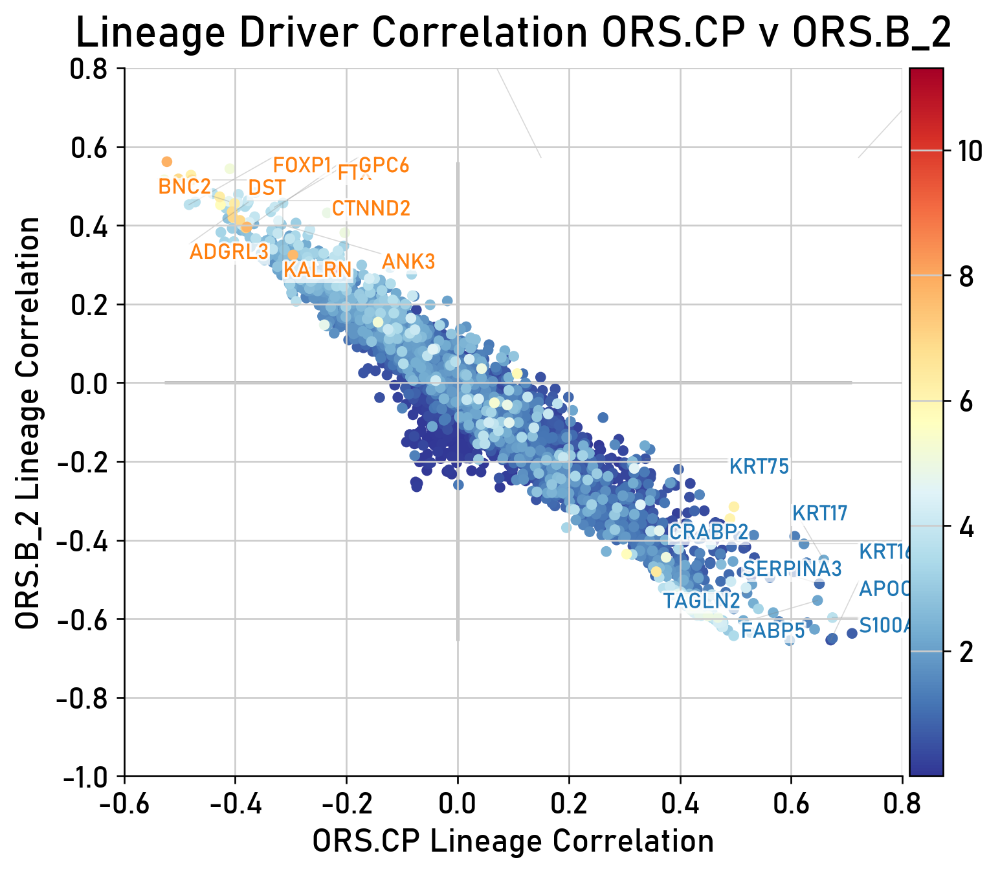

In [29]:
CP_genes = ["APOC1", "KRT75", "S100A2", "FABP5", "TAGLN2", "KRT17", "SERPINA3", "CRABP2", "KRT16"]
ORS_B_genes = ["DST", "CTNND2", "BNC2", "ADGRL3", "FOXP1", "FTX", "GPC6", "KALRN", "ANK3"] 

genes_oi_cpsb = {
    "ORS.CP": CP_genes,
    "ORS.B": ORS_B_genes,
}


ax = g.plot_lineage_drivers_correlation(
    lineage_x="ORS.CP",
    lineage_y="ORS.B_2",
    color="mean expression",
    legend_loc="none",
    gene_sets = genes_oi_cpsb,
    figsize=(6, 6),
    dpi=120,
    size=100,
    show=False
)

texts = [child for child in ax.get_children() 
         if isinstance(child, plt.Text) and 
         child not in [ax.xaxis.label, ax.yaxis.label, ax.title]]

# Apply the improved label spreading with shorter distances
improved_spread_labels(ax, texts)

ax.set_xlim(-0.6, 0.8)
ax.set_ylim(-1, 0.8)
ax.set_xlabel('ORS.CP Lineage Correlation',size=15)
ax.set_ylabel('ORS.B_2 Lineage Correlation',size=15)
ax.set_title('Lineage Driver Correlation ORS.CP v ORS.B_2', size=20, pad=10)

plt.draw()
plt.savefig(os.path.join(output_dir,'LineageDriverCorrelationCP_ORS.B.png'))
plt.show()

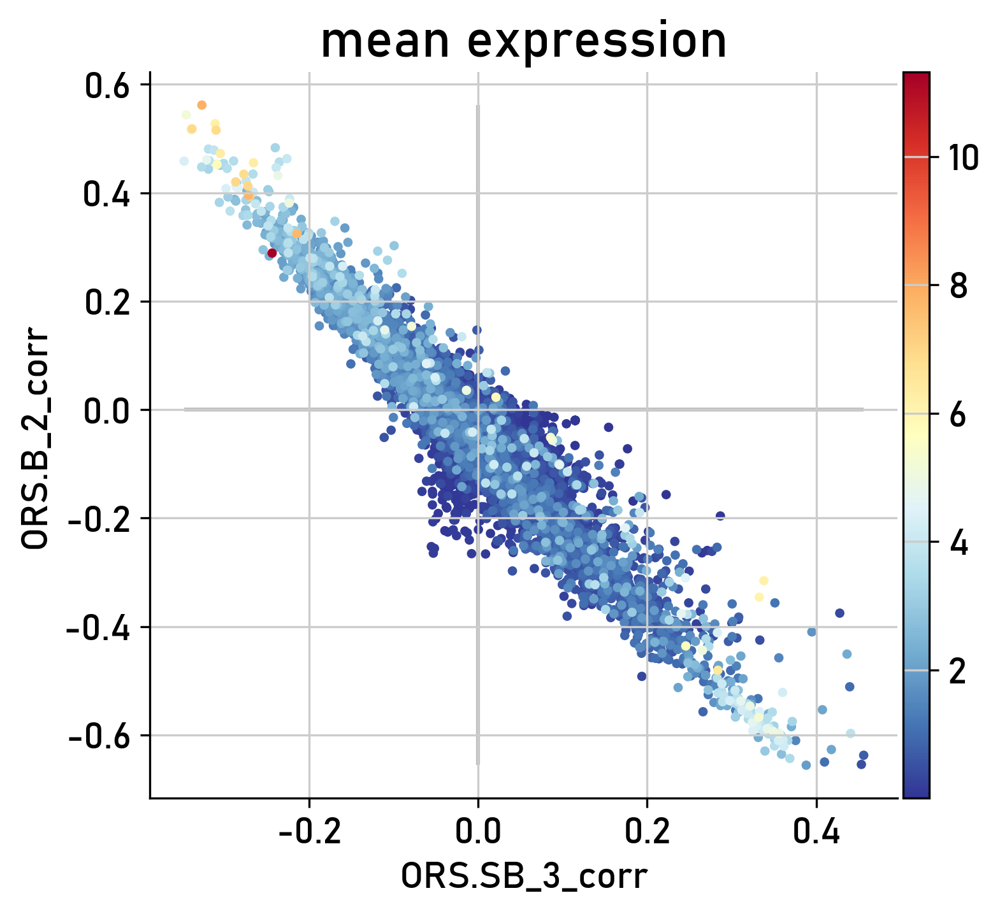

In [30]:
g.plot_lineage_drivers_correlation(
    lineage_x="ORS.SB_3",
    lineage_y="ORS.B_2",
    adjust_text=True,
    color="mean expression",
    legend_loc="none",
    figsize=(5, 5),
    dpi=150,
    fontsize=9,
    size=50
)

In [31]:
filtered_genes_sb = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="ORS.SB_3_corr",
    lineage_y="ORS.B_2_corr",
    x_threshold=-0.2,
    y_threshold=0.4,
    x_direction="less",
    y_direction="greater"
)

# Display the results
print(f"\nFound {len(filtered_genes_sb)} genes matching criteria")
display(filtered_genes_sb)

# Get just the gene names if needed
gene_list_sb = filtered_genes_sb.index.tolist()
print(gene_list_sb)

filtered_genes_ors_b = extract_genes_by_correlation(
    gpcca_obj=g,
    lineage_x="ORS.SB_3_corr",
    lineage_y="ORS.B_2_corr",
    x_threshold=0.3,
    y_threshold=-0.4,
    x_direction="greater",
    y_direction="less"
)

# Display the results
print(f"\nFound {len(filtered_genes_ors_b)} genes matching criteria")
display(filtered_genes_ors_b)

# Get just the gene names if needed
gene_list_ors_b = filtered_genes_ors_b.index.tolist()
print(gene_list_ors_b)

Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr', 'ORS.B_2_pval', 'ORS.B_2_qval', 'ORS.B_2_ci_low', 'ORS.B_2_ci_high', 'ORS.B_3_corr', 'ORS.B_3_pval', 'ORS.B_3_qval', 'ORS.B_3_ci_low', 'ORS.B_3_ci_high', 'Bulge.T1_corr', 'Bulge.T1_pval', 'Bulge.T1_qval', 'Bulge.T1_ci_low', 'Bulge.T1_ci_high']

Found 39 genes matching criteria


,ORS.SB_3_corr,ORS.B_2_corr
ENSG00000289474,-0.326948,0.561659
MACF1,-0.345462,0.543736
ENSG00000289901,-0.311264,0.527437
MT-ND3,-0.338675,0.517869
DST,-0.339718,0.515525
MT-ND2,-0.310087,0.515492
TENM4,-0.240102,0.483075
MED13L,-0.319122,0.480627
MRTFA,-0.312644,0.478642
MT-ND5,-0.305081,0.472423


['ENSG00000289474', 'MACF1', 'ENSG00000289901', 'MT-ND3', 'DST', 'MT-ND2', 'TENM4', 'MED13L', 'MRTFA', 'MT-ND5', 'CTNND2', 'BNC2', 'FNDC3B', 'ADGRL3', 'EXT1', 'KALRN', 'MT-ND1', 'MAGI1', 'FOXP1', 'MT-ND4L', 'LPP', 'KMT2C', 'GPC6', 'ARHGEF12', 'EXOC6B', 'NHSL1', 'MT-ATP6', 'EFNA5', 'MAST4', 'MT-CYB', 'RORA', 'MT-ND4', 'JMJD1C', 'NFIB', 'SYNE2', 'DIP2B', 'FTX', 'ANK3', 'MT-ATP8']
Available lineages: ['Proliferating.KCs_1_corr', 'Proliferating.KCs_1_pval', 'Proliferating.KCs_1_qval', 'Proliferating.KCs_1_ci_low', 'Proliferating.KCs_1_ci_high', 'ORS.CP_corr', 'ORS.CP_pval', 'ORS.CP_qval', 'ORS.CP_ci_low', 'ORS.CP_ci_high', 'Matrix_1_corr', 'Matrix_1_pval', 'Matrix_1_qval', 'Matrix_1_ci_low', 'Matrix_1_ci_high', 'Matrix_2_corr', 'Matrix_2_pval', 'Matrix_2_qval', 'Matrix_2_ci_low', 'Matrix_2_ci_high', 'ORS.SB_1_corr', 'ORS.SB_1_pval', 'ORS.SB_1_qval', 'ORS.SB_1_ci_low', 'ORS.SB_1_ci_high', 'ORS.SB_3_corr', 'ORS.SB_3_pval', 'ORS.SB_3_qval', 'ORS.SB_3_ci_low', 'ORS.SB_3_ci_high', 'ORS.B_2_corr

,ORS.SB_3_corr,ORS.B_2_corr
GSTP1,0.388116,-0.655520
APOC1,0.453392,-0.654128
LGALS7,0.409786,-0.649675
RPS2,0.368741,-0.643103
LGALS7B,0.456127,-0.637219
...,...,...
KRT17,0.436414,-0.450706
RHOV,0.333236,-0.424908
HES4,0.306067,-0.420996
FXYD3,0.300437,-0.418355


['GSTP1', 'APOC1', 'LGALS7', 'RPS2', 'LGALS7B', 'GAPDH', 'RPLP0', 'APOE', 'RPS18', 'RPS28', 'RPL37', 'S100A16', 'RPL39', 'RPL41', 'RPL7A', 'DYNLL1', 'RPL29', 'MIF', 'RPS29', 'RPS10', 'RPS15A', 'RPL36A', 'S100A2', 'TPT1', 'RPL10', 'RPL18A', 'RPS8', 'RPL11', 'RPL37A', 'RPLP1', 'RPS17', 'RPL32', 'RPS14', 'RPS26', 'S100A14', 'RPS12', 'RPS13', 'RPL36', 'RPL18', 'RPL23', 'RPL8', 'RPLP2', 'RPS6', 'RPS3A', 'COX6A1', 'RPL26', 'TMSB10', 'RPL35A', 'RPS21', 'RPL31', 'RPL27A', 'RPS15', 'RPL28', 'RPL21', 'RPL12', 'RPS7', 'RPS24', 'RPS3', 'RPS19', 'RPL15', 'RPL19', 'RPS23', 'MYL6', 'RPS4X', 'RPL6', 'RPS16', 'PPIA', 'RPL30', 'RPL34', 'SNHG29', 'COX8A', 'RPS27', 'FABP5', 'BTF3', 'RPL22', 'RPL10A', 'RPL27', 'RPS9', 'RPL9', 'RPL17', 'RPL13', 'ATP5F1E', 'RPS27A', 'RPL7', 'RPS25', 'RPL5', 'RPL23A', 'RPL13A', 'UBA52', 'TAGLN2', 'RPS11', 'NACA', 'COPS9', 'RPL38', 'COX6C', 'RPS5', 'HSPB1', 'RPS20', 'FAU', 'COX4I1', 'SERPINA3', 'PPDPF', 'TACSTD2', 'H1-2', 'TM4SF1', 'CALML3', 'KRT17', 'RHOV', 'HES4', 'FXYD3', '

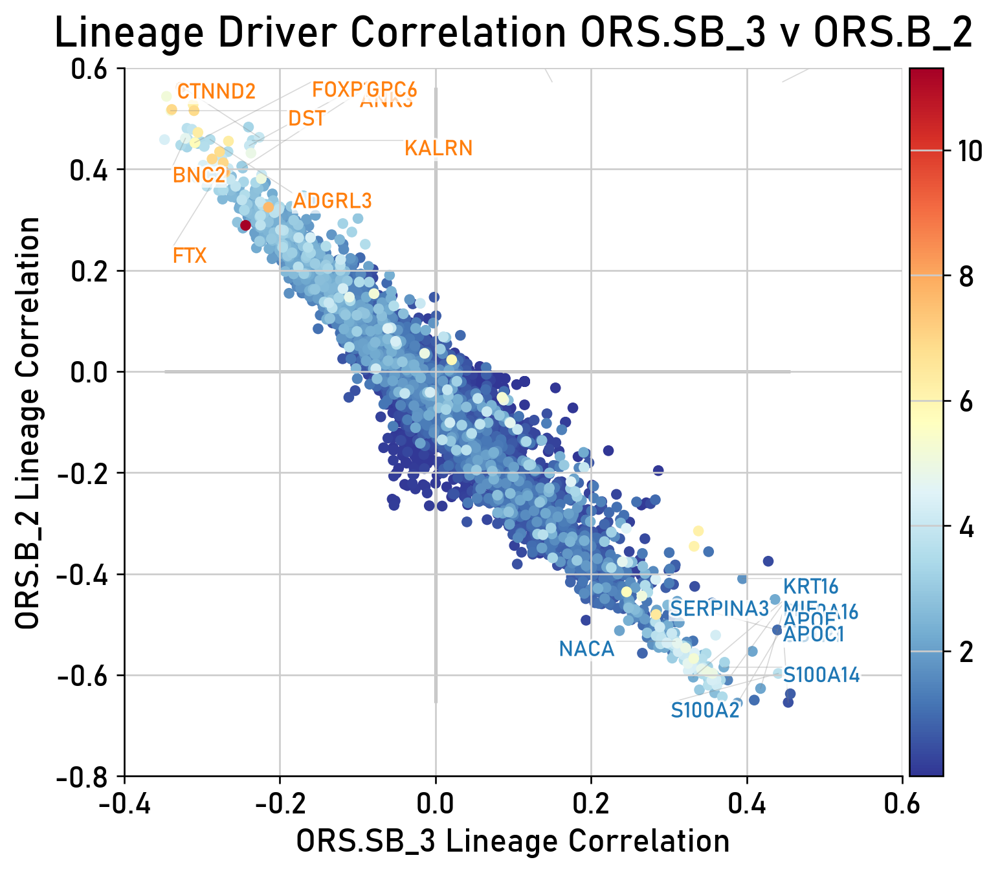

In [32]:
ORS_SB_genes = ["APOC1", "GSTP1", "APOE", "S100A16", "MIF", "S100A14", "S100A2", "NACA", "KRT16", "SERPINA3"]
ORS_B_genes = ["DST", "CTNND2", "BNC2", "ADGRL3", "FOXP1", "FTX", "GPC6", "KALRN", "ANK3"] 

genes_oi_sbb = {
    "ORS.SB": ORS_SB_genes,
    "ORS.B": ORS_B_genes,
}


ax = g.plot_lineage_drivers_correlation(
    lineage_x="ORS.SB_3",
    lineage_y="ORS.B_2",
    color="mean expression",
    legend_loc="none",
    gene_sets = genes_oi_sbb,
    figsize=(6, 6),
    dpi=120,
    size=100,
    show=False
)

texts = [child for child in ax.get_children() 
         if isinstance(child, plt.Text) and 
         child not in [ax.xaxis.label, ax.yaxis.label, ax.title]]

# Apply the improved label spreading with shorter distances
improved_spread_labels(ax, texts)

ax.set_xlim(-0.4, 0.6)
ax.set_ylim(-0.8, 0.6)
ax.set_xlabel('ORS.SB_3 Lineage Correlation',size=15)
ax.set_ylabel('ORS.B_2 Lineage Correlation',size=15)
ax.set_title('Lineage Driver Correlation ORS.SB_3 v ORS.B_2', size=20, pad=10)

plt.draw()
plt.savefig(os.path.join(output_dir,'LineageDriverCorrelationORS.SB_ORS.B.png'))
plt.show()

In [33]:
model = cr.models.GAMR(adata, n_knots=15, smoothing_penalty=10.0)

In [34]:
model

<GAMR[gene=None, lineage=None, model=None]>

Computing trends using `1` core(s)


  0%|          | 0/3000 [00:00<?, ?gene/s]

    Finish (0:05:18)


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


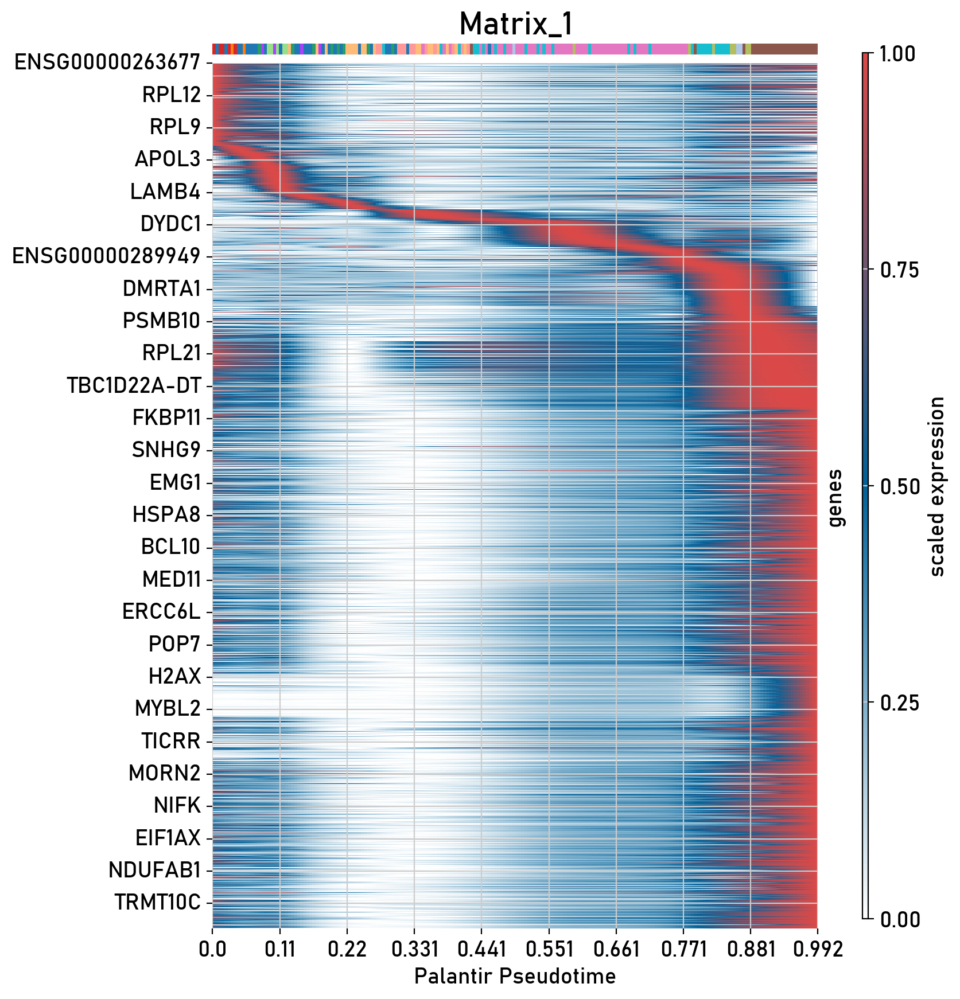

In [35]:
# Create the heatmap without title/labels first
cr.pl.heatmap(
    adata,
    model=model,
    lineages="Matrix_1",
    cluster_key="FineClust",
    data_key="MAGIC_imputed_data",
    genes=driver_df.head(3000).index,
    time_key="palantir_pseudotime",
    fontsize = 20,
    xlabel = "Palantir Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    cmap = "custom_wbr",
    weight_threshold=(1e-3, 1e-3),
    save = os.path.join(output_dir, "Matrix_1_DriverGenePseudotime.png")
)


Computing trends using `1` core(s)


  0%|          | 0/3000 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


    Finish (0:05:26)


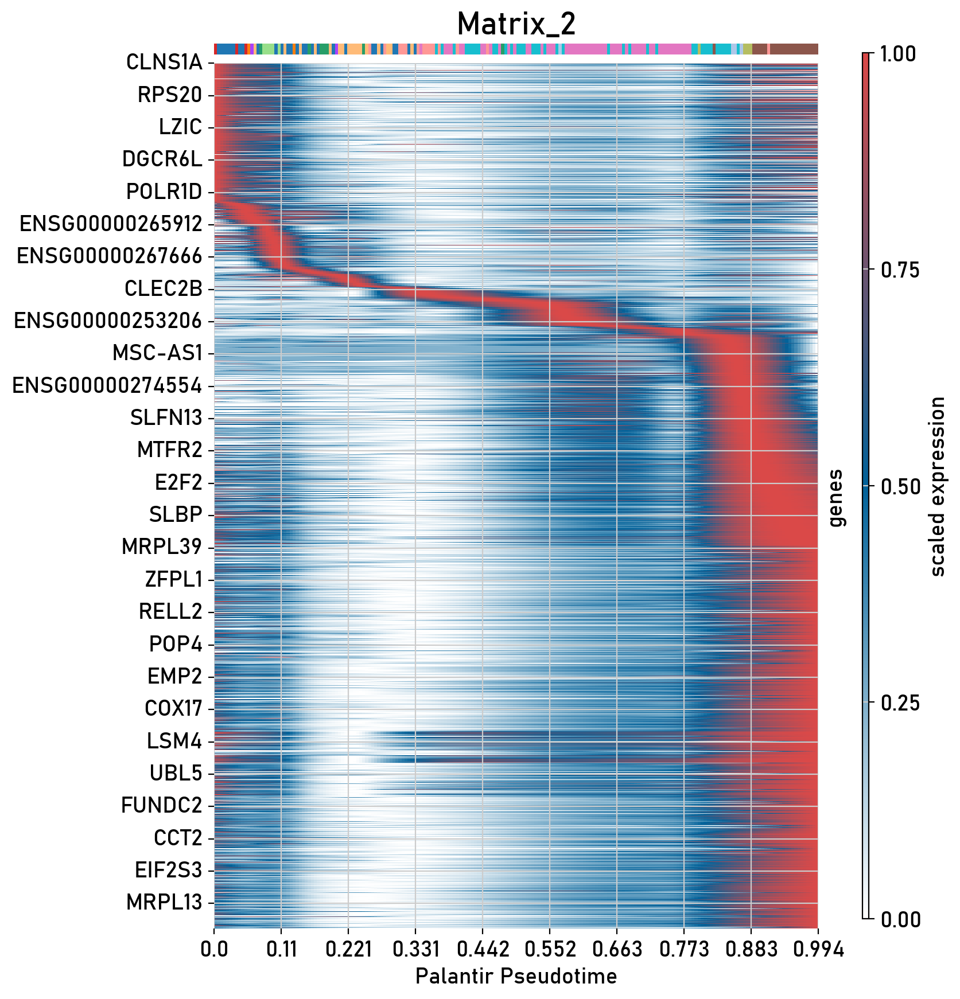

In [36]:
cr.pl.heatmap(
    adata,
    model=model,
    lineages="Matrix_2",
    cluster_key="FineClust",
    data_key="MAGIC_imputed_data",
    genes=driver_df.head(3000).index,
    time_key="palantir_pseudotime",
    fontsize = 20,
    xlabel = "Palantir Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    weight_threshold=(1e-3, 1e-3),
    cmap = "custom_wbr",
    save = os.path.join(output_dir, "Matrix_2_DriverGenePseudotime.png")
)


Computing trends using `1` core(s)


  0%|          | 0/3000 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


    Finish (0:05:47)


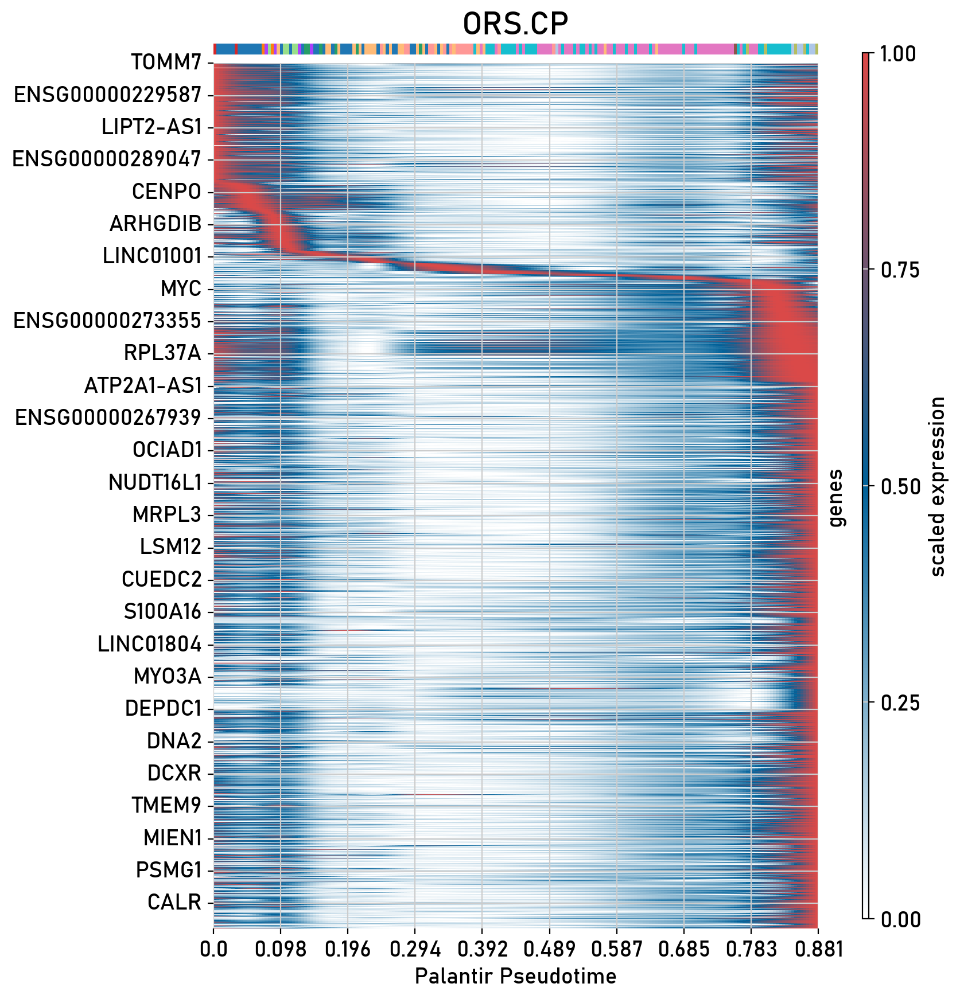

In [37]:
cr.pl.heatmap(
    adata,
    model=model,
    lineages="ORS.CP",
    cluster_key="FineClust",
    data_key="MAGIC_imputed_data",
    genes=driver_df.head(3000).index,
    time_key="palantir_pseudotime",
    fontsize = 20,
    xlabel = "Palantir Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    weight_threshold=(1e-3, 1e-3),
    cmap = "custom_wbr",
    save = os.path.join(output_dir, "ORS.CP_DriverGenePseudotime.png")
)


Computing trends using `1` core(s)


  0%|          | 0/3000 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


    Finish (0:05:45)


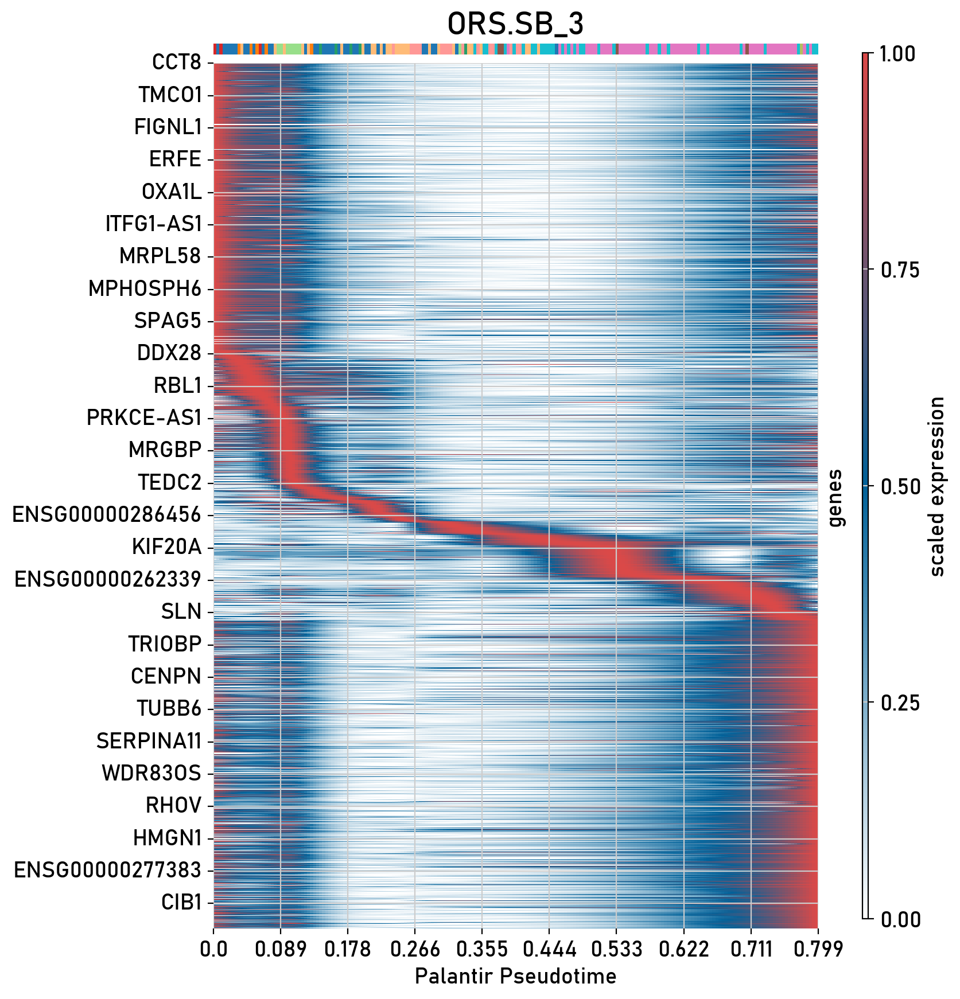

In [38]:
cr.pl.heatmap(
    adata,
    model=model,
    lineages="ORS.SB_3",
    cluster_key="FineClust",
    data_key="MAGIC_imputed_data",
    genes=driver_df.head(3000).index,
    time_key="palantir_pseudotime",
    fontsize = 20,
    xlabel = "Palantir Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    weight_threshold=(1e-3, 1e-3),
    cmap = "custom_wbr",
    save = os.path.join(output_dir, "ORS.SB_3_DriverGenePseudotime.png")
)


Computing trends using `1` core(s)


  0%|          | 0/3000 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


    Finish (0:05:44)


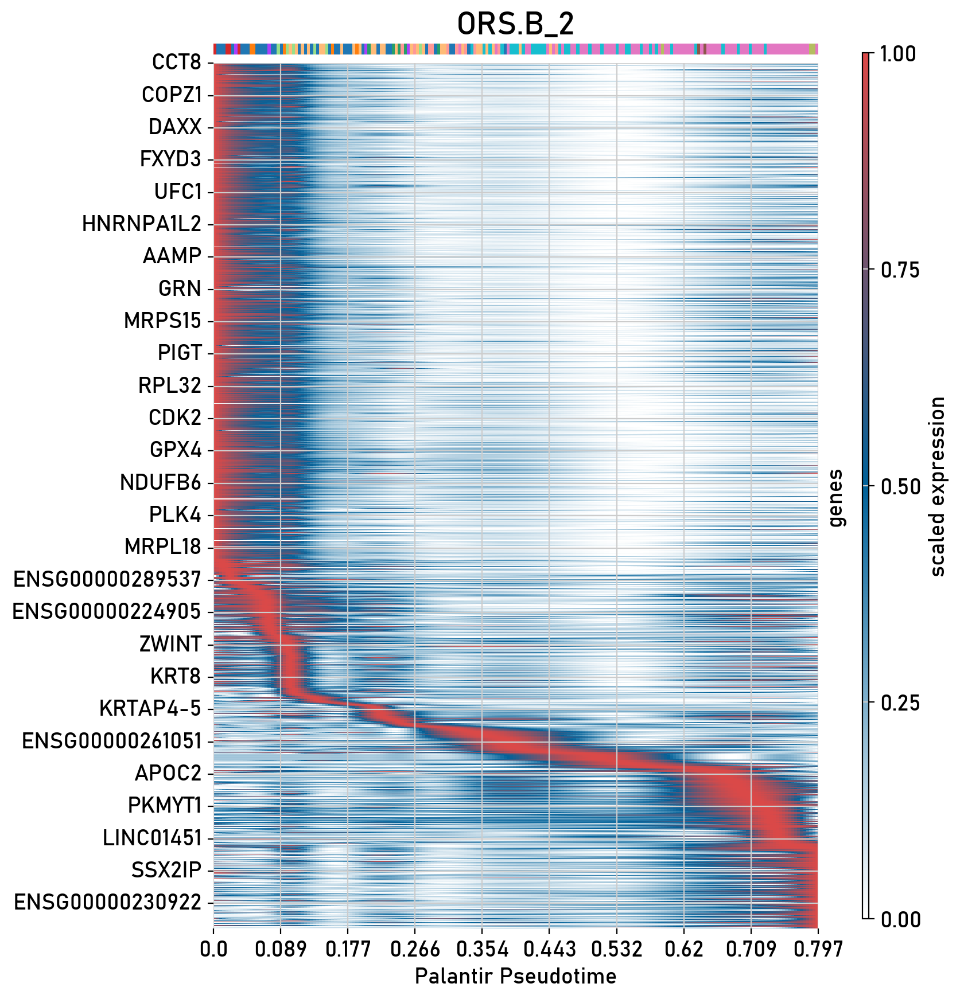

In [39]:
cr.pl.heatmap(
    adata,
    model=model,
    lineages="ORS.B_2",
    cluster_key="FineClust",
    data_key="MAGIC_imputed_data",
    genes=driver_df.head(3000).index,
    time_key="palantir_pseudotime",
    fontsize = 20,
    xlabel = "Palantir Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    weight_threshold=(1e-3, 1e-3),
    cmap = "custom_wbr",
    save = os.path.join(output_dir, "ORS.B_2_DriverGenePseudotime.png")
)